In [ ]:
'''Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23


Date  - The date of observation
Location  -The common name of the location of the weather station
MinTemp  -The minimum temperature in degrees celsius
MaxTemp -The maximum temperature in degrees celsius
Rainfall  -The amount of rainfall recorded for the day in mm
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
Sunshine  -The number of hours of bright sunshine in the day.
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
WindDir9am -Direction of the wind at 9am
WindDir3pm -Direction of the wind at 3pm
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
Humidity9am -Humidity (percent) at 9am
Humidity3pm -Humidity (percent) at 3pm
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
Cloud9am - Fraction of sky obscured by cloud at 9am. 
Cloud3pm -Fraction of sky obscured by cloud 
Temp9am-Temperature (degrees C) at 9am
Temp3pm -Temperature (degrees C) at 3pm
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

Dataset Link-  
•	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
•	https://github.com/dsrscientist/dataset3
'''

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error
# Load the dataset
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [64]:
# Display first few rows
print(df.head())


         Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
0  2008-12-01   Albury     13.4     22.9       0.6          NaN       NaN   
1  2008-12-02   Albury      7.4     25.1       0.0          NaN       NaN   
2  2008-12-03   Albury     12.9     25.7       0.0          NaN       NaN   
3  2008-12-04   Albury      9.2     28.0       0.0          NaN       NaN   
4  2008-12-05   Albury     17.5     32.3       1.0          NaN       NaN   

  WindGustDir  WindGustSpeed WindDir9am  ... Humidity9am  Humidity3pm  \
0           W           44.0          W  ...        71.0         22.0   
1         WNW           44.0        NNW  ...        44.0         25.0   
2         WSW           46.0          W  ...        38.0         30.0   
3          NE           24.0         SE  ...        45.0         16.0   
4           W           41.0        ENE  ...        82.0         33.0   

   Pressure9am  Pressure3pm  Cloud9am  Cloud3pm  Temp9am  Temp3pm  RainToday  \
0       1007.7    

In [65]:
df.dtypes #Checking the types of columns

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [66]:
df.shape # to check the dimension of the data set (rows, columns)

(8425, 23)

In [67]:
# Check for missing values
print(df.isnull().sum())


Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64


In [68]:
# Summary statistics
print(df.describe())

           MinTemp      MaxTemp     Rainfall  Evaporation     Sunshine  \
count  8350.000000  8365.000000  8185.000000  4913.000000  4431.000000   
mean     13.193305    23.859976     2.805913     5.389395     7.632205   
std       5.403596     6.136408    10.459379     5.044484     3.896235   
min      -2.000000     8.200000     0.000000     0.000000     0.000000   
25%       9.200000    19.300000     0.000000     2.600000     4.750000   
50%      13.300000    23.300000     0.000000     4.600000     8.700000   
75%      17.400000    28.000000     1.000000     7.000000    10.700000   
max      28.500000    45.500000   371.000000   145.000000    13.900000   

       WindGustSpeed  WindSpeed9am  WindSpeed3pm  Humidity9am  Humidity3pm  \
count    7434.000000   8349.000000   8318.000000  8366.000000  8323.000000   
mean       40.174469     13.847646     18.533662    67.822496    51.249790   
std        14.665721     10.174579      9.766986    16.833283    18.423774   
min         7.000000 

In [69]:
# Handle missing values
df.dropna(inplace=True)


In [70]:
df.info() #detailed information about the data frame

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3790 entries, 907 to 8385
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           3790 non-null   object 
 1   Location       3790 non-null   object 
 2   MinTemp        3790 non-null   float64
 3   MaxTemp        3790 non-null   float64
 4   Rainfall       3790 non-null   float64
 5   Evaporation    3790 non-null   float64
 6   Sunshine       3790 non-null   float64
 7   WindGustDir    3790 non-null   object 
 8   WindGustSpeed  3790 non-null   float64
 9   WindDir9am     3790 non-null   object 
 10  WindDir3pm     3790 non-null   object 
 11  WindSpeed9am   3790 non-null   float64
 12  WindSpeed3pm   3790 non-null   float64
 13  Humidity9am    3790 non-null   float64
 14  Humidity3pm    3790 non-null   float64
 15  Pressure9am    3790 non-null   float64
 16  Pressure3pm    3790 non-null   float64
 17  Cloud9am       3790 non-null   float64
 18  Cloud3

In [79]:
# Convert categorical variables to numerical using Label Encoding
le = LabelEncoder()
df['RainToday'] = le.fit_transform(df['RainToday'])
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])
df['WindGustDir'] = le.fit_transform(df['WindGustDir'])
df['WindDir9am'] = le.fit_transform(df['WindDir9am'])
df['WindDir3pm'] = le.fit_transform(df['WindDir3pm'])

In [72]:
# Convert Date to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract features from Date to day, month, year
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day



In [73]:
# Drop unnecessary columns
df.drop(['Date', 'Location'], axis=1, inplace=True)

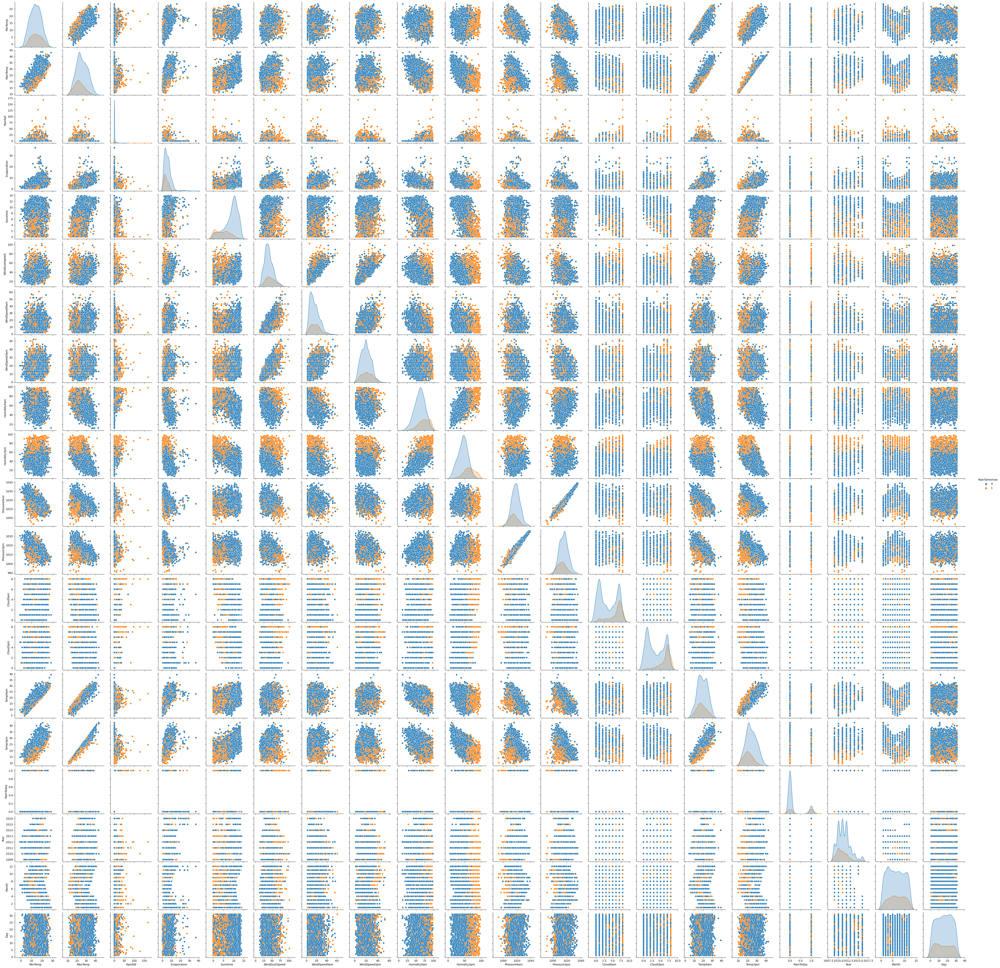

In [75]:
# Explore relationships between features and target variable
sns.pairplot(df, hue='RainTomorrow', diag_kind='kde')
plt.show()

In [ ]:
# Model Training for Rain Tomorrow (Classification)


In [81]:

# Split data into features and target variable
X = df.drop('RainTomorrow', axis=1)
y = df['RainTomorrow']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [82]:
# Initialize and train the Random Forest Classifier
classifier_model = RandomForestClassifier(random_state=42)
classifier_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [87]:
# Make predictions
y_pred_classifier = classifier_model.predict(X_test)

# Evaluate accuracy
accuracy_classifier = accuracy_score(y_test, y_pred_classifier)
print(f"Accuracy (Rain Tomorrow - Classification): {accuracy_classifier:.2f}")

# Classification report and confusion matrix
print("Classification Report:\n", classification_report(y_test, y_pred_classifier))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_classifier))

Accuracy (Rain Tomorrow - Classification): 0.90
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.96      0.93       580
           1       0.83      0.70      0.76       178

    accuracy                           0.90       758
   macro avg       0.87      0.83      0.85       758
weighted avg       0.89      0.90      0.89       758

Confusion Matrix:
 [[554  26]
 [ 53 125]]


In [86]:
# Model Training for Rainfall Amount (Regression)


In [88]:
# Filter rows where it rained
df_rain = df[df['Rainfall'] > 0]

# Split data into features and target variable for regression
X_rain = df_rain.drop('Rainfall', axis=1)
y_rain = df_rain['Rainfall']

# Split the data into training and testing sets for regression
X_train_rain, X_test_rain, y_train_rain, y_test_rain = train_test_split(X_rain, y_rain, test_size=0.2, random_state=42)

In [89]:
# Initialize and train the Random Forest Regressor
regressor_model = RandomForestRegressor(random_state=42)
regressor_model.fit(X_train_rain, y_train_rain)


RandomForestRegressor(random_state=42)

In [90]:
# Make predictions for regression
y_pred_regressor = regressor_model.predict(X_test_rain)

# Evaluate regression performance using Mean Squared Error
mse = mean_squared_error(y_test_rain, y_pred_regressor)
print(f"Mean Squared Error (Rainfall Amount - Regression): {mse:.2f}")

Mean Squared Error (Rainfall Amount - Regression): 77.29


In [91]:
# Get feature importances from the trained model
feature_importances = classifier_model.feature_importances_

# Display feature importances
feature_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_df = feature_df.sort_values(by='Importance', ascending=False)
print("Feature Importance:\n", feature_df)


Feature Importance:
           Feature  Importance
12    Humidity3pm    0.165773
4        Sunshine    0.108955
11    Humidity9am    0.059547
6   WindGustSpeed    0.054792
16       Cloud3pm    0.052795
13    Pressure9am    0.052053
14    Pressure3pm    0.051512
2        Rainfall    0.047709
18        Temp3pm    0.035958
17        Temp9am    0.035348
1         MaxTemp    0.035112
0         MinTemp    0.033458
10   WindSpeed3pm    0.032414
22            Day    0.029568
9    WindSpeed9am    0.029561
3     Evaporation    0.028325
15       Cloud9am    0.026621
7      WindDir9am    0.023893
8      WindDir3pm    0.023261
5     WindGustDir    0.022344
21          Month    0.019518
19      RainToday    0.015864
20           Year    0.015620


In [93]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid for classifier
param_grid_classifier = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30]
}

# Initialize GridSearchCV for classifier
grid_search_classifier = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_classifier, cv=3)
grid_search_classifier.fit(X_train, y_train)

# Get the best parameters for the classifier
best_params_classifier = grid_search_classifier.best_params_
print("Best Hyperparameters (Classifier):", best_params_classifier)

Best Hyperparameters (Classifier): {'max_depth': None, 'n_estimators': 100}


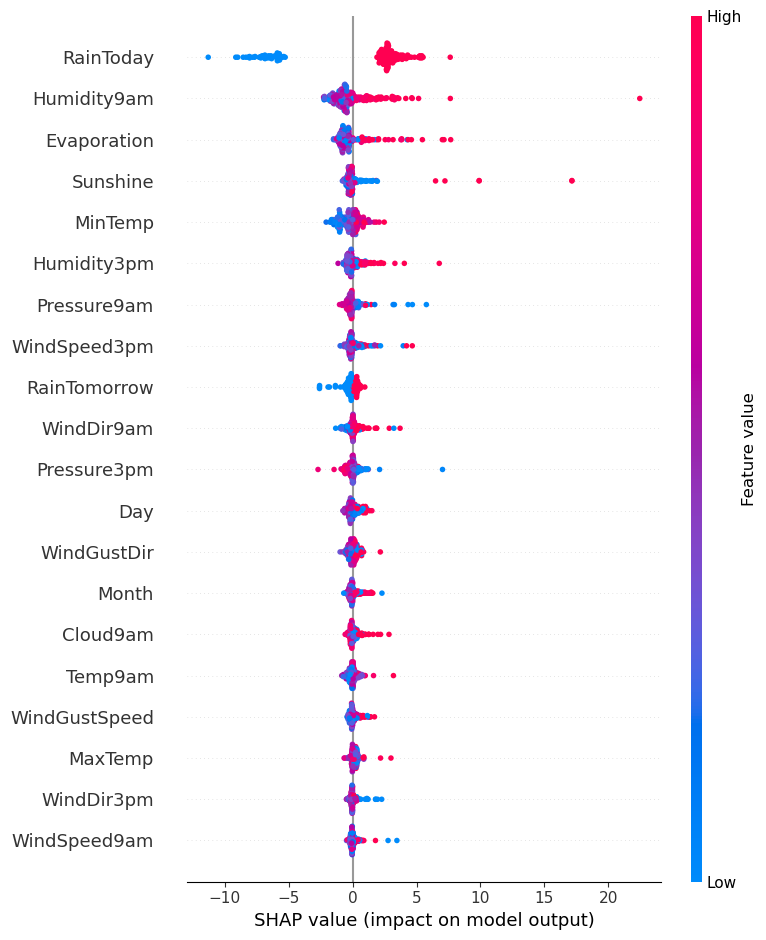

In [94]:
import shap #For regression we can use techniques like SHAP values for model interpretability

# Create a SHAP explainer for the regressor model
explainer = shap.TreeExplainer(regressor_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_rain)

# Summary plot for feature importance
shap.summary_plot(shap_values, X_test_rain)


In [95]:
import joblib

# Save the classifier model
joblib.dump(classifier_model, 'rain_classifier_model.pkl')

# Save the regressor model
joblib.dump(regressor_model, 'rainfall_regressor_model.pkl')

['rainfall_regressor_model.pkl']